## Visualising ocean currents from the IMOS Gridded Sea-level Anomaly dataset

This is a quick example to preview the content of the [Gridded sea level anomaly (GSLA) - Near real time](https://portal.aodn.org.au/search?uuid=0c9eb39c-9cbe-4c6a-8a10-5867087e703a) collection, and plot the surface geostrophic velocity.

#### Requirements

The following Python packages (and their dependencies) are used in this notebook
```
# data access & manipulation
netCDF4
h5netcdf
xarray
s3fs
scipy

# plotting
matplotlib
bokeh
hvplot
holoviews
geoviews
jupyterlab
```

### Files and structure

In [1]:
# List some of the recent files
import s3fs

s3 = s3fs.S3FileSystem(anon=True)
file_list = s3.ls("imos-data/IMOS/OceanCurrent/GSLA/NRT/2023/")
file_list[-10:]

['imos-data/IMOS/OceanCurrent/GSLA/NRT/2023/IMOS_OceanCurrent_HV_20231221T060000Z_GSLA_FV02_NRT.nc',
 'imos-data/IMOS/OceanCurrent/GSLA/NRT/2023/IMOS_OceanCurrent_HV_20231222T060000Z_GSLA_FV02_NRT.nc',
 'imos-data/IMOS/OceanCurrent/GSLA/NRT/2023/IMOS_OceanCurrent_HV_20231223T060000Z_GSLA_FV02_NRT.nc',
 'imos-data/IMOS/OceanCurrent/GSLA/NRT/2023/IMOS_OceanCurrent_HV_20231224T060000Z_GSLA_FV02_NRT.nc',
 'imos-data/IMOS/OceanCurrent/GSLA/NRT/2023/IMOS_OceanCurrent_HV_20231225T060000Z_GSLA_FV02_NRT.nc',
 'imos-data/IMOS/OceanCurrent/GSLA/NRT/2023/IMOS_OceanCurrent_HV_20231226T060000Z_GSLA_FV02_NRT.nc',
 'imos-data/IMOS/OceanCurrent/GSLA/NRT/2023/IMOS_OceanCurrent_HV_20231227T060000Z_GSLA_FV02_NRT.nc',
 'imos-data/IMOS/OceanCurrent/GSLA/NRT/2023/IMOS_OceanCurrent_HV_20231228T060000Z_GSLA_FV02_NRT.nc',
 'imos-data/IMOS/OceanCurrent/GSLA/NRT/2023/IMOS_OceanCurrent_HV_20231229T000000Z_GSLA_FV02_NRT.nc',
 'imos-data/IMOS/OceanCurrent/GSLA/NRT/2023/IMOS_OceanCurrent_HV_20231230T000000Z_GSLA_FV02

In [2]:
# Take a look at the last day of 2023
import xarray as xr

ds = xr.open_dataset(s3.open(file_list[-1]))
ds

<xarray.Dataset>
Dimensions:     (TIME: 1, LONGITUDE: 641, LATITUDE: 351)
Coordinates:
  * TIME        (TIME) datetime64[ns] 2023-12-30
  * LONGITUDE   (LONGITUDE) float64 57.0 57.2 57.4 57.6 ... 184.6 184.8 185.0
  * LATITUDE    (LATITUDE) float64 -60.0 -59.8 -59.6 -59.4 ... 9.4 9.6 9.8 10.0
Data variables:
    start_time  (TIME) datetime64[ns] ...
    end_time    (TIME) datetime64[ns] ...
    GSLA        (TIME, LATITUDE, LONGITUDE) float32 ...
    GSL         (TIME, LATITUDE, LONGITUDE) float32 ...
    UCUR        (TIME, LATITUDE, LONGITUDE) float32 ...
    VCUR        (TIME, LATITUDE, LONGITUDE) float32 ...
    UCUR_MEAN   (TIME, LATITUDE, LONGITUDE) float32 ...
    VCUR_MEAN   (TIME, LATITUDE, LONGITUDE) float32 ...
Attributes: (12/35)
    abstract:                      Gridded (adjusted) sea level anomaly (GSLA...
    acknowledgement:               Any users of IMOS data are required to cle...
    author:                        Pilo, Gabriela S
    author_email:                  gabriela.semolinipilo@csiro.au
    citation:                      The citation in a list of references is: "...
    Conventions:                   CF-1.6,IMOS-1.4
    ...                            ...
    project:                       Integrated Marine Observing System (IMOS)
    references:                    http://imos.aodn.org.au/oceancurrent
    standard_name_vocabulary:      NetCDF Climate and Forecast (CF) Metadata ...
    time_coverage_start:           2023-12-08T07:31:54Z
    time_coverage_end:             2024-01-02T19:30:04Z
    title:                         Gridded Sea Level Anomaly - Australia Region

In [3]:
# The above works well for viewing the contents of the NetCDF file interactively.
# Otherwise print(ds) gives a brief overview, then you can look at things in more detail with separate print statements
from pprint import pprint

# Global attributes in the file
pprint(ds.attrs)

{'Conventions': 'CF-1.6,IMOS-1.4',
 'abstract': 'Gridded (adjusted) sea level anomaly (GSLA), gridded sea level '
             '(GSL) and surface geostrophic velocity (UCUR,VCUR) for the '
             'Australasian region. GSLA is mapped using optimal interpolation '
             'of detided, de-meaned, inverse-barometer-adjusted altimeter and '
             'tidegauge estimates of sea level. GSL is GSLA plus an estimate '
             'of the departure of mean sea level from the geoid. The '
             'geostrophic velocities are derived from GSL.',
 'acknowledgement': 'Any users of IMOS data are required to clearly '
                    'acknowledge the source of the material derived from IMOS '
                    'in the format: "Data was sourced from the Integrated '
                    'Marine Observing System (IMOS) - IMOS is a national '
                    'collaborative research infrastructure, supported by the '
                    'Australian Government." If relevant, al

In [4]:
# Variable names
list(ds.variables)

['TIME',
 'LONGITUDE',
 'LATITUDE',
 'start_time',
 'end_time',
 'GSLA',
 'GSL',
 'UCUR',
 'VCUR',
 'UCUR_MEAN',
 'VCUR_MEAN']

In [5]:
# The ones we're interested in are UCUR and VCUR
print(ds.UCUR)

<xarray.DataArray 'UCUR' (TIME: 1, LATITUDE: 351, LONGITUDE: 641)>
[224991 values with dtype=float32]
Coordinates:
  * TIME       (TIME) datetime64[ns] 2023-12-30
  * LONGITUDE  (LONGITUDE) float64 57.0 57.2 57.4 57.6 ... 184.6 184.8 185.0
  * LATITUDE   (LATITUDE) float64 -60.0 -59.8 -59.6 -59.4 ... 9.4 9.6 9.8 10.0
Attributes:
    description:    eastward geostrophic velocity derived from GSLA + UCUR_MEAN
    long_name:      total eastward geostrophic velocity
    standard_name:  surface_geostrophic_eastward_sea_water_velocity
    units:          m/s


## Plot surface currents

### Individual velocity components

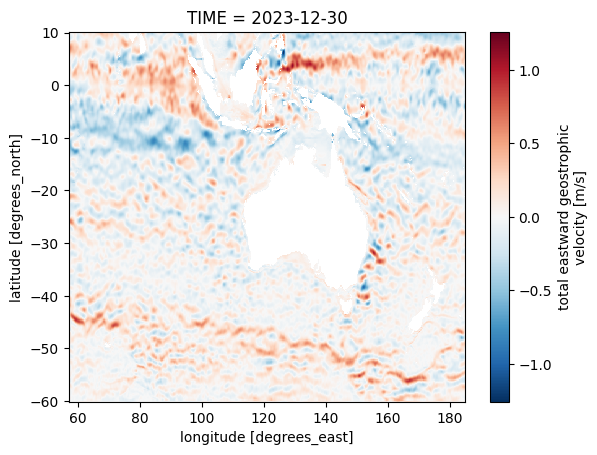

In [6]:
# We can quickly visualise the individual velocity components with xarray's built-in plotting functionality
# This uses the metadata in the file to figure out what to plot against, labels & units
ds.UCUR.plot()

In [7]:
# We can do better with hvPlot...
import holoviews as hv
from hvplot import xarray
hv.extension('bokeh', 'matplotlib')

In [12]:
# add coordinate reference system info so that xarray can interpret it
import cartopy.crs as ccrs
ds.attrs['crs'] = ccrs.PlateCarree() #"WGS84"

# plot a slightly smaller subset to speed up and avoid issues around LON=180...
ds_sub = ds.sel(TIME="2023-12-30", LATITUDE=slice(-50, 0), LONGITUDE=slice(110, 170))

uplot = ds_sub.UCUR.hvplot.quadmesh(cmap='bwr', geo=True, hover=False)
vplot = ds_sub.VCUR.hvplot.quadmesh(cmap='bwr', geo=True, hover=False)
uplot + vplot

:Layout
   .QuadMesh.I  :QuadMesh   [LONGITUDE,LATITUDE]   (UCUR)
   .QuadMesh.II :QuadMesh   [LONGITUDE,LATITUDE]   (VCUR)

### Vector field

In [56]:
# hvPlot does provide a .vectorfield() method, but it needs the velocities as magnitude & agle rather than x/y components
import numpy as np

# this seems quite memory hungry... so we'll take an even smaller subset
ds_sub = ds.sel(TIME="2023-12-30", LATITUDE=slice(-44, -34), LONGITUDE=slice(145, 155))

U = ds_sub.UCUR  # adding .values would give np.ndarray - here we use a xr.Dataarray, which keeps useful things like dimensions &coordinates
V = ds_sub.VCUR
mag = np.sqrt(U**2 + V**2)
angle = np.arctan2(V, U)
ds_vec = xr.Dataset({'mag': mag, 'angle': angle}, attrs={'crs': ds_sub.crs})

vplt = ds_vec.hvplot.vectorfield(x='LONGITUDE', y='LATITUDE', angle='angle', mag='mag', geo=True, coastline="50m", hover=False, frame_height=500)
vplt.opts(hv.opts.VectorField(magnitude='mag', color='mag'))

:Overlay
   .VectorField.I :VectorField   [LONGITUDE,LATITUDE]   (angle,mag)
   .Coastline.I   :Feature   [Longitude,Latitude]